# GİRİŞ

2020 Senesinin ilk aylarından itibaren COVİD-19 virusu hızla yayılmağa devam etmekdedir.Yayılma oranının yüksek olmasına karşı öldürme oranı düşükdür.Bu Salgın 2.Dünya Savaşından sonra en büyük küresel sorundur.

<font color = 'blue'><br>
İçerik:
    
1.[Veri Yükleme Ve İşleme](#1)<br>
2.[İstatistiksel Hesaplamalar](#2)<br>
3.[Veri Görselleştirme](#3)<br>


<a id="1"></a>
# Veri Yükleme Ve İşleme

In [106]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [107]:
countries_aggregated = pd.read_csv('dataset/countries-aggregated.csv')

time_series = pd.read_csv('dataset/time-series-19-covid-combined.csv')

key_countries = pd.read_csv('dataset/key-countries-pivoted.csv')

In [108]:
countries_aggregated.sample(10)

,Date,Country,Confirmed,Recovered,Deaths
1367,2020-01-30,Armenia,0,0.0,0
8441,2020-03-11,Nepal,1,1.0,0
3190,2020-02-09,Russia,2,0.0,0
749,2020-01-26,Haiti,0,0.0,0
8906,2020-03-14,Guatemala,1,0.0,0
6670,2020-03-01,Cuba,0,0.0,0
7430,2020-03-05,Pakistan,5,0.0,0
788,2020-01-26,Morocco,0,0.0,0
7833,2020-03-08,Bangladesh,3,0.0,0
6577,2020-02-29,North Macedonia,1,0.0,0


In [109]:
countries_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10710 entries, 0 to 10709
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       10710 non-null  object 
 1   Country    10710 non-null  object 
 2   Confirmed  10710 non-null  int64  
 3   Recovered  10106 non-null  float64
 4   Deaths     10710 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 418.5+ KB


In [110]:
countries_aggregated.isnull().sum()

Date           0
Country        0
Confirmed      0
Recovered    604
Deaths         0
dtype: int64

In [111]:
countries_aggregated['Recovered'].fillna(0,inplace = True)

In [112]:
time_series.sample(10)

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths
1313,2020-03-15,Bangladesh,NaN,23.6850,90.3563,5,0.0,0
14619,2020-01-25,Dominica,NaN,15.4150,-61.3710,0,0.0,0
4097,2020-01-24,China,Jiangsu,32.9711,119.4550,9,0.0,0
12586,2020-03-11,Somalia,NaN,5.1521,46.1996,0,0.0,0
7323,2020-02-06,France,NaN,46.2276,2.2137,6,NaN,0
1413,2020-02-18,Belarus,NaN,53.7098,27.9534,0,0.0,0
8341,2020-02-16,Indonesia,NaN,-0.7893,113.9213,0,0.0,0
5790,2020-03-19,Czechia,NaN,49.8175,15.4730,694,3.0,0
15053,2020-03-21,Canada,Recovered,0.0000,0.0000,0,NaN,0
12633,2020-02-24,South Africa,NaN,-30.5595,22.9375,0,0.0,0


In [113]:
time_series.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15183 entries, 0 to 15182
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            15183 non-null  object 
 1   Country/Region  15183 non-null  object 
 2   Province/State  4662 non-null   object 
 3   Lat             15183 non-null  float64
 4   Long            15183 non-null  float64
 5   Confirmed       15183 non-null  int64  
 6   Recovered       14074 non-null  float64
 7   Deaths          15183 non-null  int64  
dtypes: float64(3), int64(2), object(3)
memory usage: 949.1+ KB


In [114]:
time_series.isnull().sum()

Date                  0
Country/Region        0
Province/State    10521
Lat                   0
Long                  0
Confirmed             0
Recovered          1109
Deaths                0
dtype: int64

In [115]:
time_series['Recovered'].fillna(0,inplace = True)
time_series['Province/State'].fillna('Anomaly',inplace = True)

In [116]:
key_countries.sample(10)

,Date,China,US,United_Kingdom,Italy,France,Germany,Spain,Iran
54,2020-03-16,81033,4632,1551,27980,6683,7272,9942,14991
23,2020-02-14,66358,13,9,3,11,16,2,0
15,2020-02-06,30587,11,2,2,6,12,1,0
21,2020-02-12,44759,12,9,3,11,16,2,0
18,2020-02-09,39829,11,3,3,11,14,2,0
24,2020-02-15,68413,13,9,3,12,16,2,0
53,2020-03-15,81003,3499,1145,24747,4532,5795,7798,13938
4,2020-01-26,2075,5,0,0,3,0,0,0
31,2020-02-22,77001,15,9,62,12,16,2,28
51,2020-03-13,80945,2179,802,17660,3681,3675,5232,11364


In [117]:
key_countries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63 entries, 0 to 62
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            63 non-null     object
 1   China           63 non-null     int64 
 2   US              63 non-null     int64 
 3   United_Kingdom  63 non-null     int64 
 4   Italy           63 non-null     int64 
 5   France          63 non-null     int64 
 6   Germany         63 non-null     int64 
 7   Spain           63 non-null     int64 
 8   Iran            63 non-null     int64 
dtypes: int64(8), object(1)
memory usage: 4.6+ KB


In [118]:
key_countries.isnull().sum()

Date              0
China             0
US                0
United_Kingdom    0
Italy             0
France            0
Germany           0
Spain             0
Iran              0
dtype: int64

<a id="2"></a>
# İstatistiksel Hesaplamalar

In [119]:
new_data = countries_aggregated[countries_aggregated.Date == '2020-03-24']
new_data.describe()

,Confirmed,Recovered,Deaths
count,170.000000,170.0,170.000000
mean,2462.811765,0.0,109.558824
std,10175.009297,0.0,638.596084
min,1.000000,0.0,0.000000
25%,7.500000,0.0,0.000000
50%,107.000000,0.0,1.000000
75%,533.500000,0.0,5.750000
max,81591.000000,0.0,6820.000000


In [120]:
new_data = time_series[time_series.Date == '2020-03-24']
new_data.describe()

,Lat,Long,Confirmed,Recovered,Deaths
count,241.000000,241.000000,241.000000,241.0,241.000000
mean,21.881843,26.037580,1737.253112,0.0,77.282158
std,24.603439,70.707958,8094.787815,0.0,535.162206
min,-41.454500,-123.120700,0.000000,0.0,0.000000
25%,7.540000,-9.696600,12.000000,0.0,0.000000
50%,24.000000,21.758700,97.000000,0.0,1.000000
75%,41.295600,90.000000,416.000000,0.0,4.000000
max,71.706900,178.065000,69176.000000,0.0,6820.000000


In [121]:
key_countries.describe()

,China,US,United_Kingdom,Italy,France,Germany,Spain,Iran
count,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
mean,57346.936508,3545.301587,706.634921,9078.158730,2308.714286,3145.126984,3689.730159,4428.444444
std,30333.726887,10224.508245,1703.588161,17512.370523,5075.153621,7429.824295,8755.770319,7218.014797
min,548.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32348.500000,11.000000,2.500000,2.500000,6.000000,12.500000,1.000000,0.000000
50%,77001.000000,15.000000,9.000000,62.000000,12.000000,16.000000,2.000000,28.000000
75%,80841.500000,550.500000,298.000000,8273.500000,1177.500000,1108.000000,873.000000,6863.500000
max,81591.000000,53740.000000,8164.000000,69176.000000,22622.000000,32986.000000,39885.000000,24811.000000


In [122]:
corr = countries_aggregated.corr()
corr

,Confirmed,Recovered,Deaths
Confirmed,1.000000,0.829769,0.913361
Recovered,0.829769,1.000000,0.747457
Deaths,0.913361,0.747457,1.000000


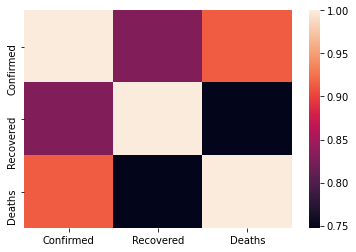

In [123]:
sns.heatmap(corr, xticklabels=corr.columns.values,yticklabels=corr.columns.values)

In [124]:
cov = countries_aggregated.cov()
cov

,Confirmed,Recovered,Deaths
Confirmed,2.903329e+07,1.349803e+07,1.134318e+06
Recovered,1.349803e+07,9.114436e+06,5.201102e+05
Deaths,1.134318e+06,5.201102e+05,5.312366e+04


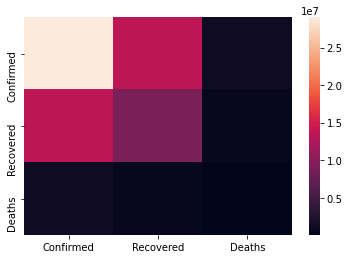

In [125]:
sns.heatmap(cov, xticklabels=cov.columns.values,yticklabels=cov.columns.values)

In [126]:
corr = time_series.corr()
corr

,Lat,Long,Confirmed,Recovered,Deaths
Lat,1.000000,-0.123934,0.052116,0.025008,0.040604
Long,-0.123934,1.000000,0.069032,0.073475,0.047438
Confirmed,0.052116,0.069032,1.000000,0.798310,0.922673
Recovered,0.025008,0.073475,0.798310,1.000000,0.732901
Deaths,0.040604,0.047438,0.922673,0.732901,1.000000


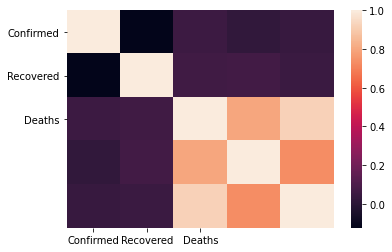

In [127]:
sns.heatmap(corr, xticklabels=cov.columns.values,yticklabels=cov.columns.values)

In [128]:
cov = time_series.cov()
cov

,Lat,Long,Confirmed,Recovered,Deaths
Lat,602.857192,-214.721709,4.977723e+03,1.239468e+03,188.994592
Long,-214.721709,4979.197915,1.894887e+04,1.046559e+04,634.578525
Confirmed,4977.722687,18948.873686,1.513218e+07,6.268537e+06,680419.768632
Recovered,1239.467832,10465.591261,6.268537e+06,4.074629e+06,280457.928007
Deaths,188.994592,634.578525,6.804198e+05,2.804579e+05,35938.207604


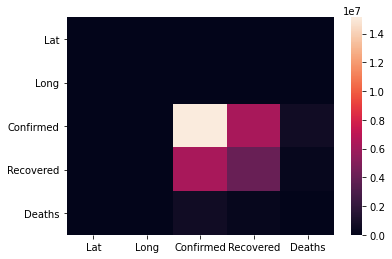

In [129]:
sns.heatmap(cov, xticklabels=cov.columns.values,yticklabels=cov.columns.values)

In [130]:
corr = key_countries.corr()
corr

,China,US,United_Kingdom,Italy,France,Germany,Spain,Iran
China,1.000000,0.278454,0.331830,0.414053,0.363624,0.338831,0.338052,0.488585
US,0.278454,1.000000,0.982830,0.913367,0.958403,0.969398,0.972005,0.807043
United_Kingdom,0.331830,0.982830,1.000000,0.968564,0.991768,0.996097,0.996298,0.888403
Italy,0.414053,0.913367,0.968564,1.000000,0.989375,0.979144,0.979766,0.970751
France,0.363624,0.958403,0.991768,0.989375,1.000000,0.996139,0.997508,0.931149
Germany,0.338831,0.969398,0.996097,0.979144,0.996139,1.000000,0.998081,0.904800
Spain,0.338052,0.972005,0.996298,0.979766,0.997508,0.998081,1.000000,0.906825
Iran,0.488585,0.807043,0.888403,0.970751,0.931149,0.904800,0.906825,1.000000


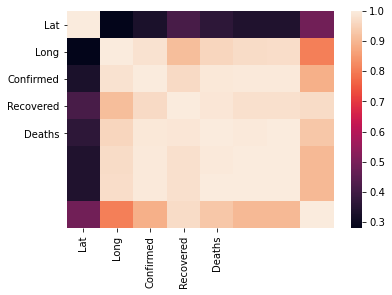

In [131]:
sns.heatmap(corr, xticklabels=cov.columns.values,yticklabels=cov.columns.values)

In [132]:
cov = key_countries.cov()
cov

,China,US,United_Kingdom,Italy,France,Germany,Spain,Iran
China,9.201350e+08,8.636169e+07,1.714772e+07,2.199512e+08,5.597933e+07,7.636372e+07,8.978503e+07,1.069754e+08
US,8.636169e+07,1.045406e+08,1.711928e+07,1.635432e+08,4.973243e+07,7.364160e+07,8.701724e+07,5.956028e+07
United_Kingdom,1.714772e+07,1.711928e+07,2.902213e+06,2.889600e+07,8.574802e+06,1.260796e+07,1.486101e+07,1.092427e+07
Italy,2.199512e+08,1.635432e+08,2.889600e+07,3.066831e+08,8.793366e+07,1.274002e+08,1.502317e+08,1.227074e+08
France,5.597933e+07,4.973243e+07,8.574802e+06,8.793366e+07,2.575718e+07,3.756190e+07,4.432616e+07,3.411036e+07
Germany,7.636372e+07,7.364160e+07,1.260796e+07,1.274002e+08,3.756190e+07,5.520229e+07,6.492902e+07,4.852314e+07
Spain,8.978503e+07,8.701724e+07,1.486101e+07,1.502317e+08,4.432616e+07,6.492902e+07,7.666351e+07,5.731067e+07
Iran,1.069754e+08,5.956028e+07,1.092427e+07,1.227074e+08,3.411036e+07,4.852314e+07,5.731067e+07,5.209974e+07


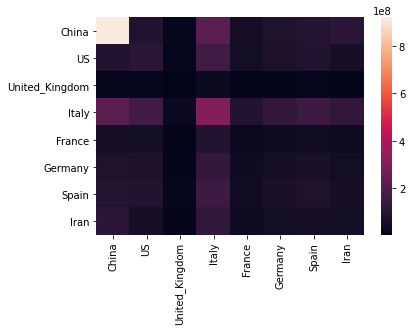

In [133]:
sns.heatmap(cov, xticklabels=cov.columns.values,yticklabels=cov.columns.values)

<a id="3"></a>
# Veri Görselleştirme

In [134]:
new_data = countries_aggregated[countries_aggregated.Date == '2020-03-24']
fig = px.pie(new_data, values='Confirmed', names='Country',title='GLOBAL COVID-19 CONFIRMED 2020-03-24')
fig.show()

In [135]:
fig = px.pie(new_data, values='Deaths', names='Country',title='GLOBAL COVID-19 DEATHS 2020-03-24')
fig.show()

In [136]:
fig = px.bar(time_series, x='Date', y="Confirmed",color='Country/Region')
fig.show()

In [137]:
fig = px.bar(time_series, x='Date', y="Recovered",color='Country/Region')
fig.show()

In [138]:
fig = px.bar(time_series, x='Date', y="Deaths",color='Country/Region')
fig.show()

In [139]:
fig = px.line(time_series, x="Date", y="Deaths", color="Country/Region")
fig.show()

In [140]:
fig = px.line(countries_aggregated, x="Confirmed", y="Recovered",color='Country')
fig.show()

In [141]:
fig = px.line(countries_aggregated, x="Confirmed", y="Deaths", color="Country")
fig.show()

In [142]:
fig = px.scatter(time_series,x='Country/Region', y='Deaths',color="Date")
fig.show()

In [143]:
fig = px.scatter(time_series, x='Country/Region', y='Confirmed',color="Date")
fig.show()

In [144]:
fig = px.scatter(time_series, x='Country/Region', y='Recovered',color="Date")
fig.show()

In [145]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.China,
                         name="China",
                         line_color='red',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.US,name="US",
                         line_color='aqua',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.United_Kingdom,name="United_Kingdom",
                         line_color='coral',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.Italy,
                         name="Italy",
                         line_color='orange',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.France,
                         name="France",
                         line_color='darkblue',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.Germany,
                         name="Germany",
                         line_color='green',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.Spain,
                         name="Spain",
                         line_color='lime',
                         opacity=1))

fig.add_trace(go.Scatter(x=key_countries.Date,
                         y=key_countries.Iran,
                         name="Iran",
                         line_color='yellow',
                         opacity=1))

fig.show()

In [146]:
fig = px.scatter_geo(time_series, lat="Lat",lon ="Long",
                     color="Confirmed",
                     hover_name="Country/Region",
                     size="Confirmed", 
                     projection="natural earth")
fig.show()

In [147]:
fig = px.scatter_geo(time_series, lat="Lat",lon ="Long",
                     color="Recovered",
                     hover_name="Country/Region",
                     size="Recovered", 
                     projection="natural earth")
fig.show()

In [148]:
fig = px.scatter_geo(time_series, lat="Lat",lon ="Long",
                     color="Deaths",
                     hover_name="Country/Region",
                     size="Deaths", 
                     projection="natural earth")
fig.show()